<a href="https://colab.research.google.com/github/mshivam-kumar/Computer-Vision/blob/main/Copy_of_ES666_Assignment_B_Where_is_the_Mystery%3F.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Task

### Pre-defined code

In [ ]:
# Mounting google drive
from google.colab import drive
drive.mount('/content/drive')

# Downloading all the required libraries


# Importing all the required libraries
import numpy as np
import cv2
import matplotlib.pyplot as plt
from matplotlib import style
from glob import glob
from natsort import natsorted
from tqdm import tqdm
style.use('ggplot')

Mounted at /content/drive


In [ ]:
# Loading all the images in the drive
gt_images = []

for files in tqdm(natsorted(glob('/content/drive/My Drive/ES666CV/images/B/*'))):
    gt_images.append(cv2.imread(files, 1))

gt_images = np.array(gt_images) # Only possible because all images are of same size

100%|██████████| 6/6 [00:03<00:00,  1.77it/s]


In [ ]:
def show_image_grid(images, M, N, title='Title', figsize=8):
    # Assuming 'images' is a numpy array of shape (num_images, height, width, channels)
    if M==1:
        row_size = figsize
        col_size = figsize//4
    elif N==1:
        row_size = figsize//4
        col_size = figsize
    else:
        row_size, col_size = figsize, figsize

    fig, axes = plt.subplots(M, N, figsize=(row_size, col_size))

    if len(images.shape) < 4:
        images = np.expand_dims(images.copy(), axis=0)

    fig.suptitle(title)
    for i in range(M):
        for j in range(N):
            if M==1 and N==1:
                ax = axes
            elif M == 1 or N==1:
                ax = axes[max(i, j)]
            else:
                ax = axes[i, j]
            index = i * N + j
            if index < images.shape[0]:
                ax.imshow(cv2.cvtColor(images[index], cv2.COLOR_BGR2RGB))
            ax.axis('off')
    plt.tight_layout()
    plt.show()

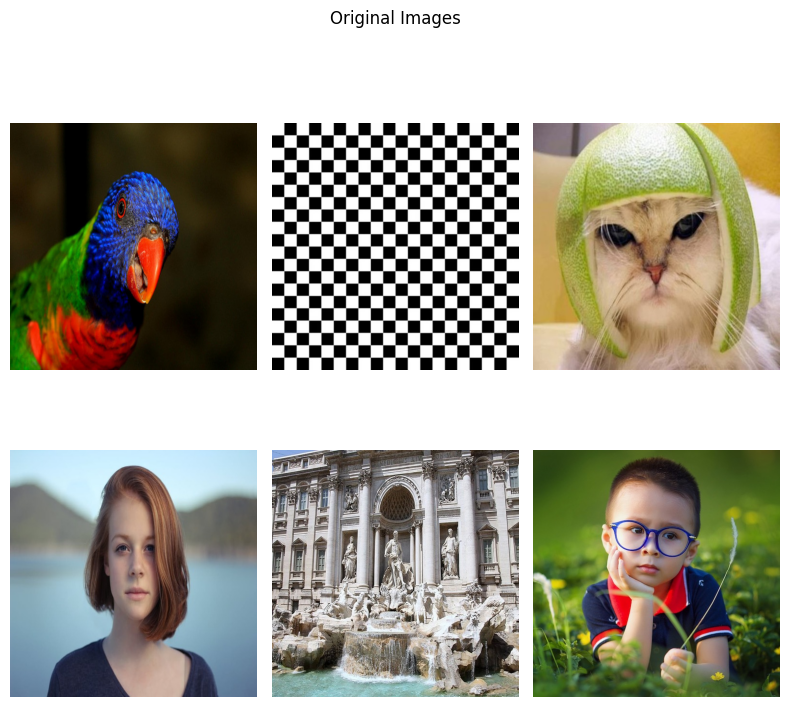

In [ ]:
show_image_grid(gt_images, 2, 3, 'Original Images', figsize=8)

### Q1 [2 Marks]

Implement Gaussian Pyramid Downsampling method from scratch.Compare it with Opencv resize method. What difference do you observe when you resize an image with Gaussian Pyramid approach and Opencv approach.

References:
1. [Gaussian & Laplacian pyramid	construction](https://www.cs.toronto.edu/~mangas/teaching/320/slides/CSC320L10.pdf)
2. [Multi-Scale Representation](https://medium.com/jun94-devpblog/cv-4-multi-scale-representation-gaussian-and-laplacian-pyramid-527ca4c4831c)

In [ ]:
def pad_image_to_divisible(image, K, pad_value=0):
    # Get the original image dimensions
    h, w = image.shape[:2]

    # Calculate the padding needed for height and width
    pad_h = (K - (h % K)) % K  # Padding needed for height
    pad_w = (K - (w % K)) % K  # Padding needed for width

    # Compute the padding to add to top/bottom and left/right
    pad_top = pad_h // 2
    pad_bottom = pad_h - pad_top
    pad_left = pad_w // 2
    pad_right = pad_w - pad_left

    # Pad the image: (top, bottom), (left, right), and (no padding on channels)
    if len(image.shape) == 3:  # For RGB images
        padded_image = np.pad(image, ((pad_top, pad_bottom), (pad_left, pad_right), (0, 0)),
                              mode='constant', constant_values=pad_value)
    else:  # For grayscale images
        padded_image = np.pad(image, ((pad_top, pad_bottom), (pad_left, pad_right)),
                              mode='constant', constant_values=pad_value)

    return padded_image

In [ ]:
def gaussian_pyramid(image, levels):
    pyramid = [image]
    for i in range(levels - 1):
        # Apply Gaussian blur and downsample by a factor of 2

        # Write code here
        # blurred_image = cv2.GaussianBlur(image, (5, 5), 1.5)
        # image = cv2.pyrDown(blurred_image)

        image = pad_image_to_divisible(image, pyramid[0].shape[0])
        pyramid.append(image)

    return np.array(pyramid)

def opencv_resize(inp_image, levels):
    pyramid = []
    h, w    = inp_image.shape[:2]
    for i in range(levels):
        # Apply Gaussian blur and downsample by a factor of 2
        # Write code here
        blurred_image = cv2.GaussianBlur(inp_image, (5, 5), 1.5)
        image = cv2.resize(blurred_image, (h//2**i, w//2**i))

        image = pad_image_to_divisible(image, min(h, w))
        pyramid.append(image)

    return np.array(pyramid)

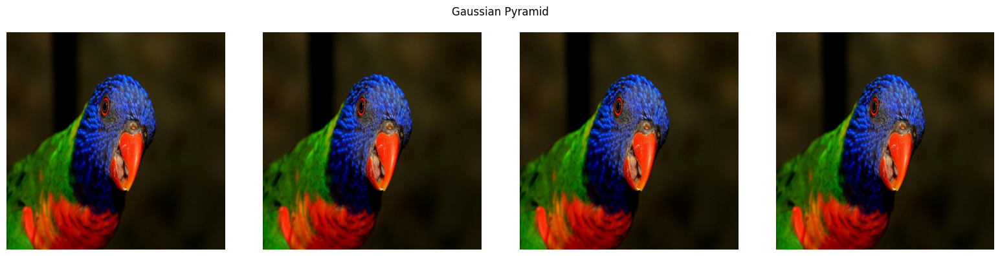

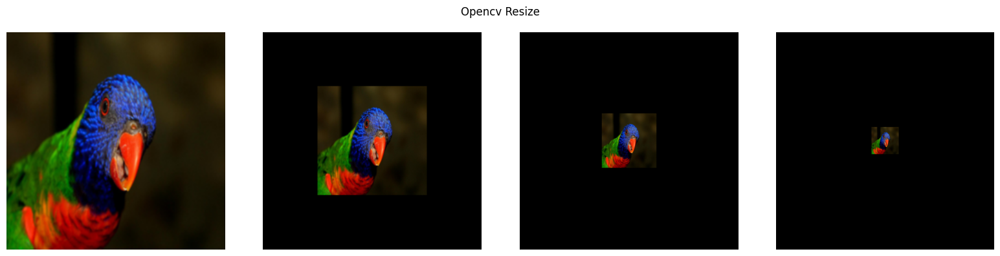

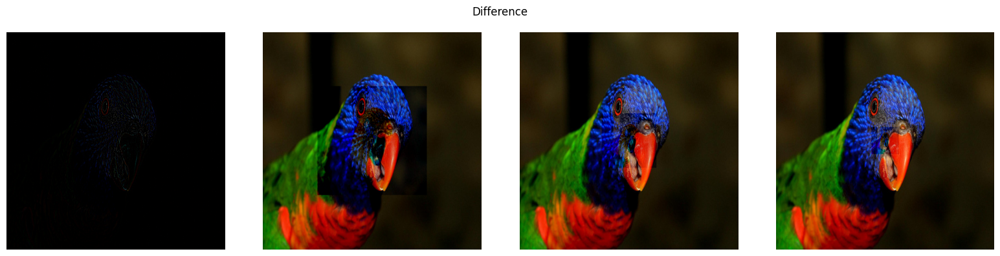

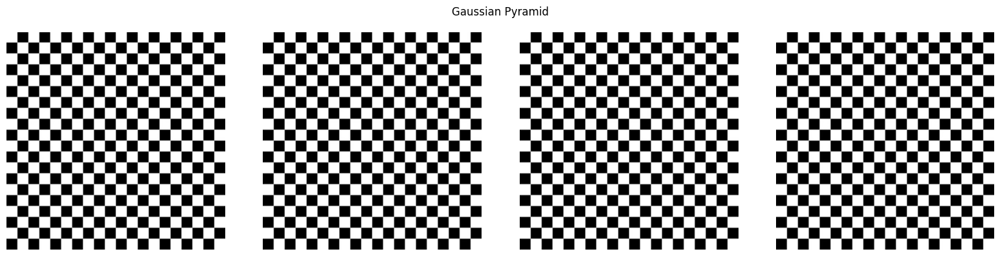

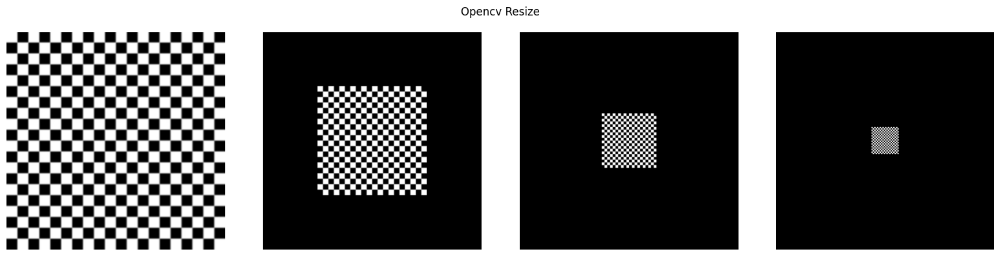

...

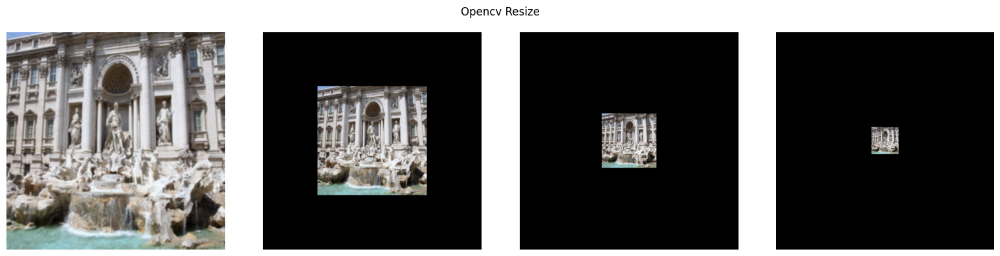

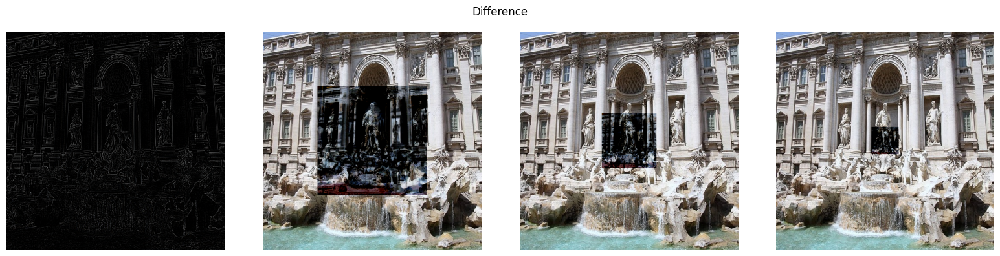

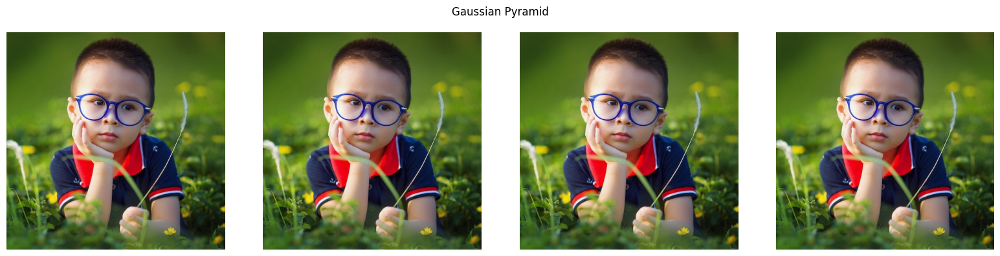

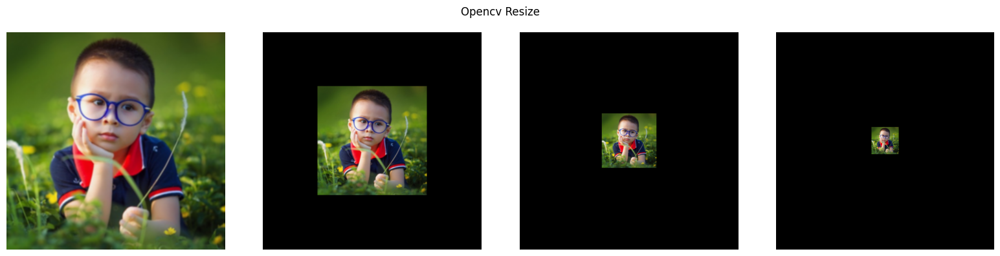

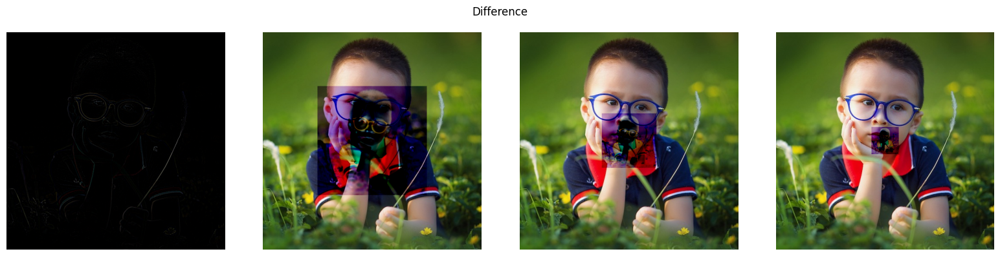

In [ ]:
for idx, image in enumerate(gt_images):

    # Generate pyramid of images for matching
    s_image_pyramids = gaussian_pyramid(image, levels=4)
    s_image_opecv_resize = opencv_resize(image, levels=4)

    diff = []
    for gauss_img, open_img in zip(s_image_pyramids, s_image_opecv_resize):
        diff.append(cv2.subtract(gauss_img, open_img))
    diff = np.array(diff)

    show_image_grid(s_image_pyramids, 1, 4, 'Gaussian Pyramid', figsize=16)
    show_image_grid(s_image_opecv_resize, 1, 4, 'Opencv Resize', figsize=16)
    show_image_grid(diff, 1, 4, 'Difference', figsize=16)

### Q2 [4 Marks]

You have to implement image blending technique using Laplacian Pyramids from scratch.

You can use following functions from opencv/scipy:

* convolution
* cv2.subtract
* cv2.add
* cv2.resize
* padding

You can follow this article for more explanation:

1. [Image Blending Using Laplacian Pyramids](https://becominghuman.ai/image-blending-using-laplacian-pyramids-2f8e9982077f)

In [ ]:
import cv2
import numpy as np

def laplacian_pyramid_blend_images(image_a, image_b):
    blende_image=None
    if image_a.shape != image_b.shape:
        raise ValueError("Both images must have the same dimensions for blending.")

    h, w, _ = image_a.shape

    levels = min(4, int(np.log2(min(h, w))) - 1)  # Limit levels to avoid too much downsampling

    gaussian_pyramid_a = [image_a]
    gaussian_pyramid_b = [image_b]

    for i in range(levels):
        image_a = cv2.pyrDown(gaussian_pyramid_a[-1])
        image_b = cv2.pyrDown(gaussian_pyramid_b[-1])
        gaussian_pyramid_a.append(image_a)
        gaussian_pyramid_b.append(image_b)

    laplacian_pyramid_a = [gaussian_pyramid_a[-1]]  # Start with the smallest level
    laplacian_pyramid_b = [gaussian_pyramid_b[-1]]

    for i in range(levels - 1, 0, -1):
        # Upsample the current pyramid level
        upsampled_a = cv2.pyrUp(gaussian_pyramid_a[i], dstsize=(gaussian_pyramid_a[i - 1].shape[1], gaussian_pyramid_a[i - 1].shape[0]))
        upsampled_b = cv2.pyrUp(gaussian_pyramid_b[i], dstsize=(gaussian_pyramid_b[i - 1].shape[1], gaussian_pyramid_b[i - 1].shape[0]))

        laplacian_a = cv2.subtract(gaussian_pyramid_a[i - 1], upsampled_a)
        laplacian_b = cv2.subtract(gaussian_pyramid_b[i - 1], upsampled_b)

        laplacian_pyramid_a.append(laplacian_a)
        laplacian_pyramid_b.append(laplacian_b)

    # Create a smooth gradient mask for blending
    mask = np.zeros((h, w), dtype=np.float32)  # Create a mask with the same height and width
    for i in range(w):
        mask[:, i] = i / w  # Gradient from 0 (left) to 1 (right)

    # Blend the Laplacian pyramids using the gradient mask
    blended_pyramid = []
    for lap_a, lap_b in zip(laplacian_pyramid_a, laplacian_pyramid_b):
        current_mask = cv2.resize(mask, (lap_a.shape[1], lap_a.shape[0]))

        laplacian_blend = lap_a * current_mask[:, :, np.newaxis] + lap_b * (1 - current_mask[:, :, np.newaxis])

        laplacian_blend = np.clip(laplacian_blend, 0, 255)

        blended_pyramid.append(laplacian_blend)

    # Reconstruct the blended image from the blended pyramid
    blended_image = blended_pyramid[-1]
    for i in range(levels - 1, -1, -1):
        # Upsample the blended image to the next level
        blended_image = cv2.pyrUp(blended_image)

        if blended_image.shape != blended_pyramid[i].shape:
            blended_image = cv2.resize(blended_image, (blended_pyramid[i].shape[1], blended_pyramid[i].shape[0]))

        blended_image = cv2.add(blended_image, blended_pyramid[i])

    # resize blended_image back to the original size
    blended_image = cv2.resize(blended_image, (w, h), interpolation=cv2.INTER_LINEAR)

    blended_image = np.clip(blended_image, 0, 255).astype(np.uint8)

    if(not blended_image.any()):
       return image_a
    return blended_image


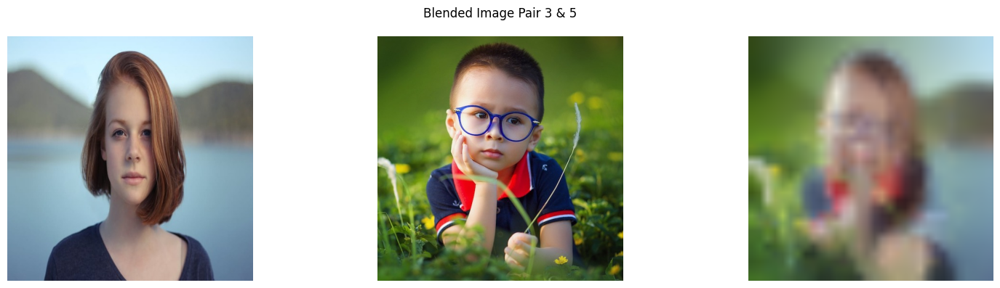

In [ ]:
blended_image = laplacian_pyramid_blend_images(gt_images[3], gt_images[5])
collage = np.array([gt_images[3], gt_images[5], blended_image])
show_image_grid(collage, 1, 3, 'Blended Image Pair 3 & 5', figsize=16)

### Q3 [4 Marks]

Implement Harris and Hessian Corner Detector algorithm from scratch.

You can use following functions from opencv/scipy:

* convolution
* cv2.subtract
* cv2.add
* cv2.resize
* padding

You can follow this article for more explanation:

1. [Harris and Hessian Corner Detector](https://medium.com/jun94-devpblog/cv-10-local-feature-descriptors-harris-and-hessian-corner-detector-7d524888abfd)

In [ ]:
def detect_harris_corner(image):
    corner_image  = None
    # Write your code here

    if corner_image == None:
        return image

    return corner_image

In [ ]:

def detect_harris_corner(image):
    corner_image=None
    gray_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    gray_image = np.float32(gray_image)  # Convert to float32

    # Harris corner detection
    harris_corners = cv2.cornerHarris(gray_image, blockSize=2, ksize=3, k=0.04)

    # Normalize and convert to uint8
    harris_corners = cv2.normalize(harris_corners, None, 0, 255, cv2.NORM_MINMAX)
    harris_corners = np.uint8(harris_corners)

    # Create a mask to draw corners
    corner_mask = np.zeros_like(harris_corners)
    corner_mask[harris_corners > 50] = 255  # Thresholding to find strong corners

    # Find centroids of the corners
    _, labels, stats, centroids = cv2.connectedComponentsWithStats(corner_mask)

    # Draw corners on the original image
    corner_image = np.copy(image)
    for i in range(1, len(centroids)):  # Skip the first component, which is the background
        cv2.circle(corner_image, (int(centroids[i][0]), int(centroids[i][1])), 5, (0, 0, 255), -1)

    if(not corner_image.any()):
      return  image

    return corner_image


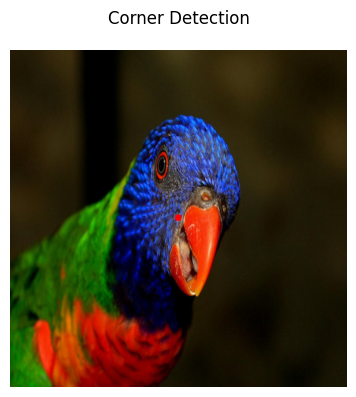

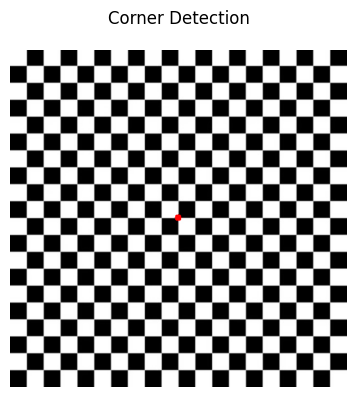

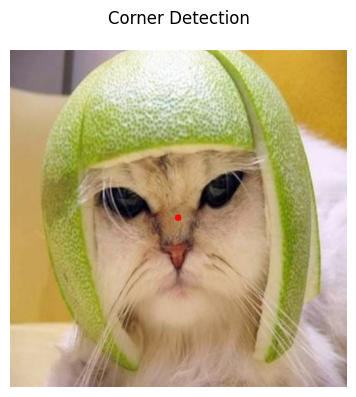

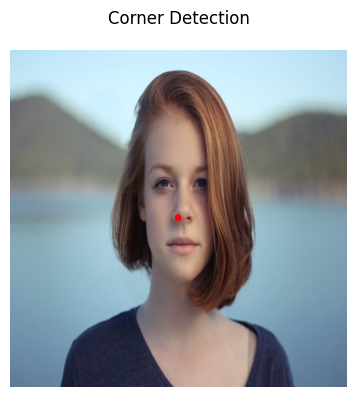

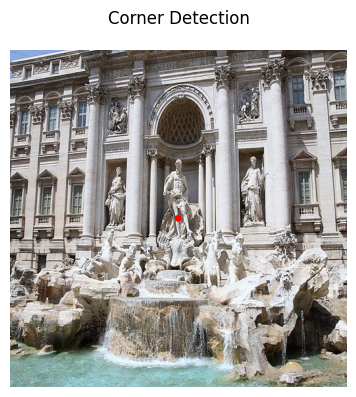

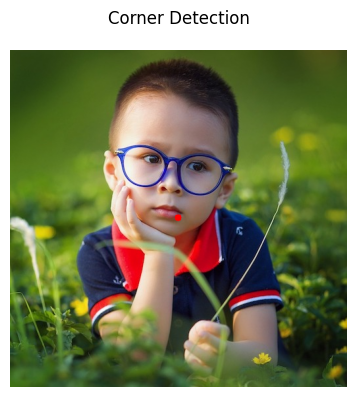

In [ ]:
for image in gt_images:
    corner_image = detect_harris_corner(image)
    show_image_grid(corner_image, 1, 1, 'Corner Detection', figsize=16)